In [5]:
# !apt-get install libcairo2-dev libjpeg-dev libgif-dev
# !pip install pycairo
# !pip install python-igraph
# !pip install matplotlib

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import igraph as ig
import networkx as nx
from utils import check_if_equal, create_adj_matrix, create_degree_dict,load_graph 

In [3]:
chimp_graph, human_graph = load_graph()


Total number of different edges : 756


In [4]:
print(f"Density of chimp connectome : {chimp_graph.density()}")
print(f"Density of human connectome : {human_graph.density()}")

print(f"Avg Degree Distribution of chimp connectome : {sum(chimp_graph.degree()) / len(chimp_graph.degree())}")
print(f"Avg Degree Distribution of human connectome : {sum(human_graph.degree()) / len(human_graph.degree())}")

Density of chimp connectome : 0.19757433489827858
Density of human connectome : 0.2147887323943662
Avg Degree Distribution of chimp connectome : 28.055555555555557
Avg Degree Distribution of human connectome : 30.5


In [9]:
c_degree_dict = create_degree_dict(chimp_graph)
h_degree_dict = create_degree_dict(human_graph)

sort_orders = sorted(c_degree_dict.items(), key=lambda x: x[1], reverse=True)
top_five = [(sort_orders[i]) for i in range(5)]
print(f"Top 5 Nodes according to vertex degree in chimpanzee : {top_five}")

sort_orders = sorted(h_degree_dict.items(), key=lambda x: x[1], reverse=True)
top_five = [(sort_orders[i]) for i in range(5)]
print(f"Top 5 Nodes according to vertex degree in human : {top_five}")

Top 5 Nodes according to vertex degree in chimpanzee : [('rOB', 71), ('lOB', 62), ('rFDdelta', 57), ('lFDdelta', 50), ('lIB', 48)]
Top 5 Nodes according to vertex degree in human : [('rPF', 59), ('lFE', 58), ('lPF', 58), ('rPEp', 52), ('rOB', 47)]


In [10]:
h_degree_list = list(human_graph.degree())
c_degree_list = list(chimp_graph.degree())

diff_degree = [(chimp_graph.vs[i]['label'].item(), h_degree_list[i] - c_degree_list[i]) for i in range(len(h_degree_list))]

sort_orders = sorted(diff_degree, key=lambda x: x[1], reverse=True)
top_five = [(sort_orders[i]) for i in range(5)]
print(f"Top 5 Nodes according to vertex degree differences in Humans : {top_five}")

sort_orders = sorted(diff_degree, key=lambda x: x[1])
top_five = [(sort_orders[i]) for i in range(5)]
print(f"Top 5 Nodes according to vertex degree differences in chimpanzee : {top_five}")


Top 5 Nodes according to vertex degree differences in Humans : [('lFE', 32), ('lPF', 32), ('rPF', 29), ('rFE', 19), ('lTE2', 18)]
Top 5 Nodes according to vertex degree differences in chimpanzee : [('rFDdelta', -39), ('lFDdelta', -30), ('rFDL', -28), ('lFDL', -26), ('rOB', -24)]


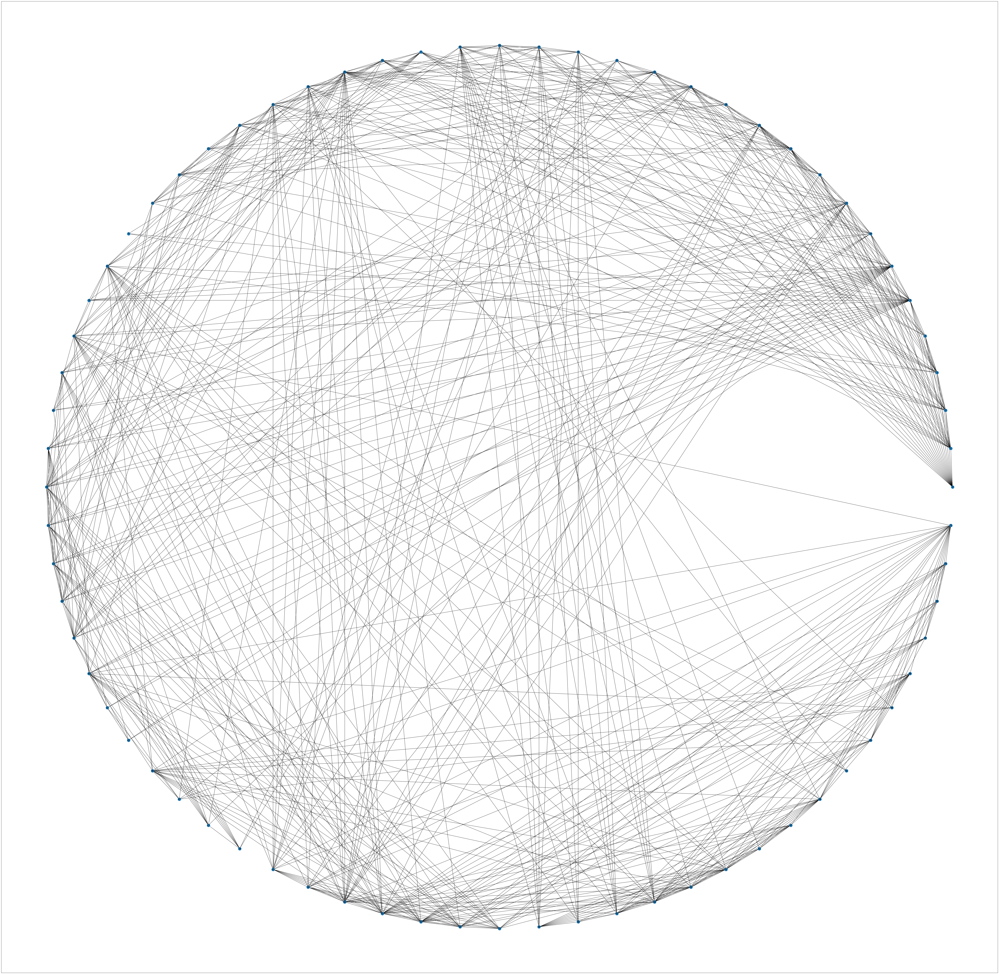

In [12]:
h_graph = nx.Graph(human_graph.get_edgelist())
c_graph = nx.Graph(chimp_graph.get_edgelist())

pos = nx.circular_layout(h_graph) 
  
plt.figure(figsize = (100, 100)) 
nx.draw_networkx(h_graph, pos) 


In [9]:
max_flow = []
for i, sourceVertex in enumerate(human_graph.vs):
#     print(sourceVertex)
#     source = sourceVertex["label"]
    for j, targetVertex in enumerate(human_graph.vs):
#         target = targetVertex["label"]
        
        if i == j:
            continue
        
        max_flow.append((human_graph.maxflow(i, j).value, i, j))
max_flow.sort(reverse = True)
print(f'Maximum flow value is: {str(max_flow[0][0])} for pair of vertices: {max_flow[0][1]}_to_{max_flow[0][2]}')
# print(max_flow)

Maximum flow value is: 29.0 for pair of vertices: 61_to_25


In [14]:
max_flow = []
for i, sourceVertex in enumerate(chimp_graph.vs):
#     print(sourceVertex)
#     source = sourceVertex["label"]
    for j, targetVertex in enumerate(chimp_graph.vs):
#         target = targetVertex["label"]
        
        if i == j:
            continue
        
        max_flow.append((chimp_graph.maxflow(i, j).value, i, j))
max_flow.sort(reverse = True)
print(f'Maximum flow value is: {str(max_flow[0][0])} for pair of vertices: {max_flow[0][1]}_to_{max_flow[0][2]}')
# print(max_flow)

Maximum flow value is: 31.0 for pair of vertices: 55_to_19
